In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.linalg import svd
from sklearn.decomposition import PCA
from PIL import Image

from sklearn.preprocessing import StandardScaler

- How to Calculate SVD

In [2]:
A = np.array([[1, 2, 3],
              [4, 5, 6],
              [7, 8, 9]])

U, s, Vt = svd(A, full_matrices=False)

print("Original Matrix A:")
print(A)
print(f"\nShape: {A.shape}")

print("\nU (Left singular vectors):")
print(U)
print(f"\nShape: {U.shape}")

print("\nSingular Values (s):")
print(s)

Original Matrix A:
[[1 2 3]
 [4 5 6]
 [7 8 9]]

Shape: (3, 3)

U (Left singular vectors):
[[-0.21483724  0.88723069  0.40824829]
 [-0.52058739  0.24964395 -0.81649658]
 [-0.82633754 -0.38794278  0.40824829]]

Shape: (3, 3)

Singular Values (s):
[1.68481034e+01 1.06836951e+00 4.41842475e-16]


In [3]:
# s is 1D array of singular values
# Convert to diagonal matrix
Sigma = np.diag(s)

print("\nSigma (Diagonal matrix):")
print(Sigma)
print(f"Shape: {Sigma.shape}")

print("\nV^T (Right singular vectors, transposed):")
print(Vt)
print(f"Shape: {Vt.shape}")


Sigma (Diagonal matrix):
[[1.68481034e+01 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.06836951e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 4.41842475e-16]]
Shape: (3, 3)

V^T (Right singular vectors, transposed):
[[-0.47967118 -0.57236779 -0.66506441]
 [-0.77669099 -0.07568647  0.62531805]
 [-0.40824829  0.81649658 -0.40824829]]
Shape: (3, 3)


In [4]:
A_reconstructed = A @ Sigma @ Vt
print(A_reconstructed)
print(f"\nReconstruction error: {np.abs(A - A_reconstructed).max():.2e}")

[[ -9.74113553  -9.80503398  -9.86893243]
 [-36.4751632  -38.97755258 -41.47994196]
 [-63.20919087 -68.15007118 -73.09095149]]

Reconstruction error: 8.21e+01


- Find numerical rank

In [32]:
A = np.random.randn(100, 100)
U, s, Vt = np.linalg.svd(A, full_matrices=False)

# True rank (all singular values)
true_rank = np.sum(s > 1e-10)

# Numerical rank (significant singular values)
tolerance = s[0] * 1e-6  # Relative tolerance
numerical_rank = np.sum(s > tolerance)

print(f"True rank: {true_rank}")
print(f"Numerical rank: {numerical_rank}")
print(f"First 10 singular values: {s[:10]}")

True rank: 100
Numerical rank: 100
First 10 singular values: [19.63038726 18.68237756 18.31107921 18.01587988 17.78840252 17.33501786
 17.16015542 16.80760232 16.51056494 16.35254818]


#### SVD in PCA

In [5]:
x = np.random.randn(100, 10)
x_centered = x - x.mean(axis=0)

# Method 1: PCA (uses SVD internally)
pca = PCA(n_components=5)
x_pca = pca.fit_transform(x_centered)

In [6]:
# Method 2: Direct SVD
U, s, Vt = np.linalg.svd(x_centered, full_matrices=False)

principal_components_svd = Vt[:5].T
X_svd = x_centered @ principal_components_svd

print("PCA components shape:", pca.components_.shape)
print("SVD components shape:", principal_components_svd.shape)
print("\nComponents match:", np.allclose(pca.components_.T, principal_components_svd, atol=1e-10))

PCA components shape: (5, 10)
SVD components shape: (10, 5)

Components match: False


#### Low-Rank Approximation

In [7]:
np.random.seed(42)
A = np.random.randn(50, 30)

true_rank = 5
U_true = np.random.randn(50, true_rank)
V_true = np.random.randn(true_rank, 30)
A_structured = U_true @ V_true + 0.1 * np.random.randn(50, 30)

In [8]:
U, s, Vt = np.linalg.svd(A_structured, full_matrices=False)

# Low-rank approximations
ranks = [1, 3, 5, 10, 20]
approximation_errors = []

for rank in ranks:
    U_k = U[:, :rank]
    s_k = s[:rank]
    Vt_k = Vt[:rank, :]
    
    # Reconstruct
    A_approx = U_k @ np.diag(s_k) @ Vt_k
    
    error = np.linalg.norm(A_structured - A_approx, 'fro')
    approximation_errors.append(error)
    
    print(f"Rank {rank:2d} approximation error: {error:.4f}")

Rank  1 approximation error: 65.4014
Rank  3 approximation error: 35.9739
Rank  5 approximation error: 3.3071
Rank 10 approximation error: 2.4444
Rank 20 approximation error: 1.2007


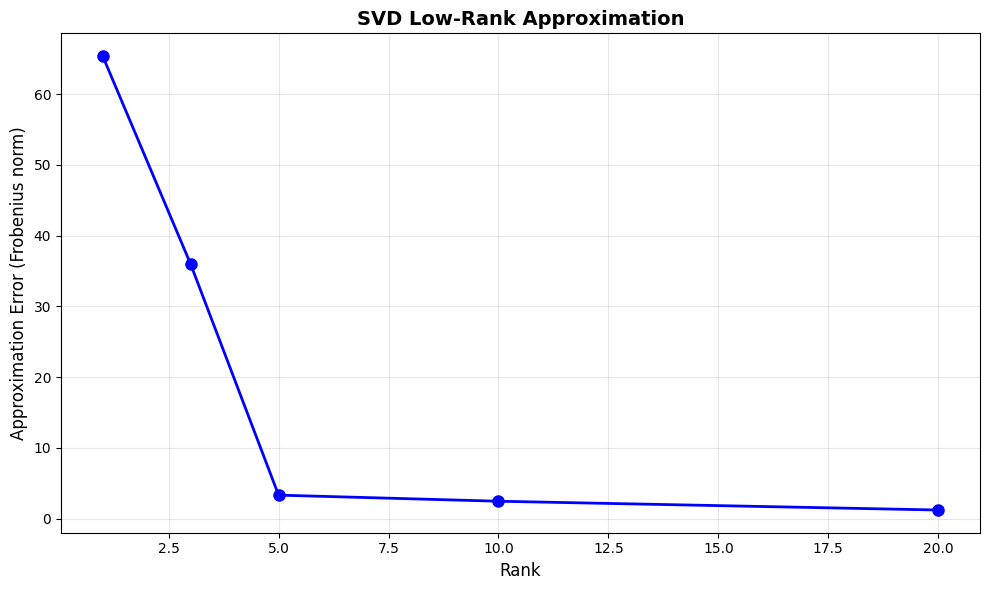

In [9]:
plt.figure(figsize=(10, 6))
plt.plot(ranks, approximation_errors, 'bo-', linewidth=2, markersize=8)

plt.xlabel('Rank', fontsize=12)
plt.ylabel('Approximation Error (Frobenius norm)', fontsize=12)
plt.title('SVD Low-Rank Approximation', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

#### Applications of SVD
1. Image Compression:

In [10]:
img = Image.open('C:/Users/User/Pictures/wallpapers/miles-morales-spiderman-swinging-action-pose-desktop-wallpaper-4k.jpg')

img_array = np.array(img.convert('L')) # Convert to grayscale

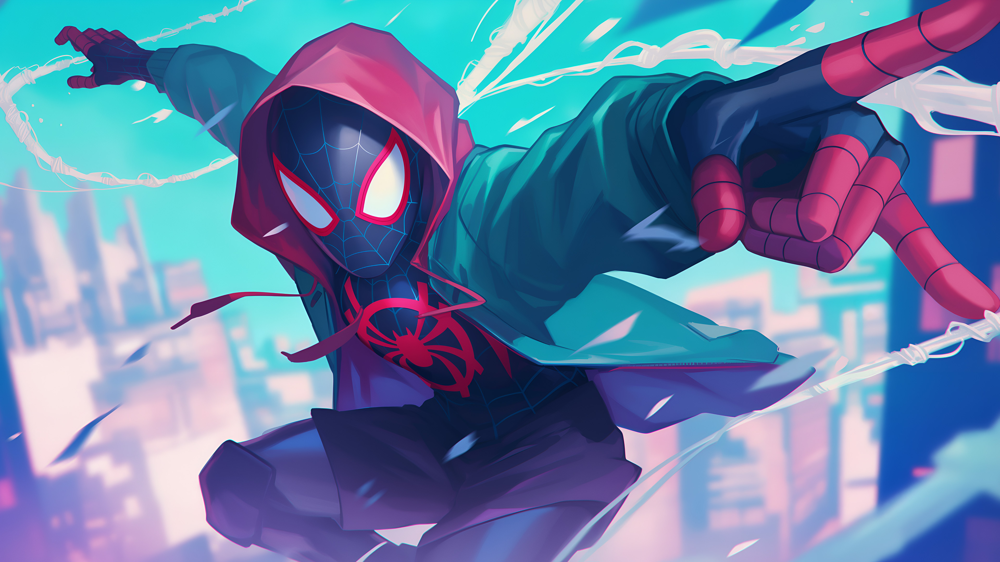

In [12]:
img

In [13]:
# SVD
U, s, Vt = np.linalg.svd(img_array, full_matrices=False)

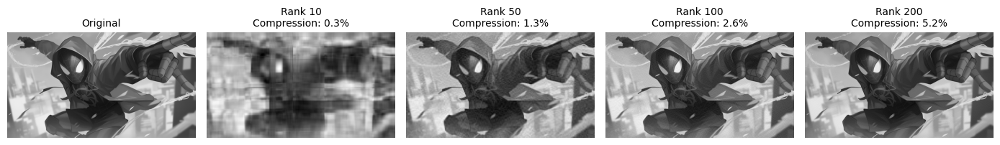

In [23]:
# Compress with different ranks
ranks = [10, 50, 100, 200]
fig, axes = plt.subplots(1, len(ranks) + 1, figsize=(14, 3))

axes[0].imshow(img_array, cmap='gray')
axes[0].set_title('Original', fontsize=10)
axes[0].axis('off')

for idx, rank in enumerate(ranks, 1):
    U_k = U[:, :rank]
    s_k = s[:rank]
    Vt_k = Vt[:rank, :]
    img_compressed = U_k @ np.diag(s_k) @ Vt_k
    
    axes[idx].imshow(img_compressed, cmap='gray')
    axes[idx].set_title(f'Rank {rank}\nCompression: {rank/img_array.shape[1]*100:.1f}%', fontsize=10)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

2. Recommender Systems:

In [24]:
# User-item matrix (ratings)
ratings = np.array([
    [5, 4, 0, 0, 1],
    [4, 5, 3, 0, 2],
    [0, 0, 5, 4, 3],
    [0, 0, 4, 5, 4],
    [1, 2, 3, 4, 5]
])

U, s, Vt = np.linalg.svd(ratings, full_matrices=False)

In [26]:
# Low-rank approximation (latent factors)
k = 2
U_k = U[:, :k]
s_k = s[:k]
Vt_k = Vt[:k, :]

# Reconstructed 
ratings_pred = U_k @ np.diag(s_k) @ Vt_k

print("Original ratings:")
print(ratings)
print("\nPredicted ratings (SVD approximation):")
print(ratings_pred.round(2))

Original ratings:
[[5 4 0 0 1]
 [4 5 3 0 2]
 [0 0 5 4 3]
 [0 0 4 5 4]
 [1 2 3 4 5]]

Predicted ratings (SVD approximation):
[[ 4.36  4.42  0.67 -0.69  1.02]
 [ 4.5   4.69  2.01  0.69  2.31]
 [-0.19  0.2   3.96  4.26  3.77]
 [-0.27  0.15  4.29  4.64  4.08]
 [ 1.33  1.73  4.08  3.9   4.01]]


3. Noise Reduction:

In [27]:
# Signal with noise
t = np.linspace(0, 10, 1000)
signal = np.sin(2 * np.pi * t) + 0.5 * np.sin(4 * np.pi * t)
noise = 0.3 * np.random.randn(1000)
noisy_signal = signal + noise

In [28]:
window_size = 50
matrix = np.array([noisy_signal[i:i+window_size] for i in range(len(noisy_signal) - window_size + 1)])

In [29]:
U, s, Vt = np.linalg.svd(matrix, full_matrices=False)


# Keep only top singular values (remove noise)
k = 5  # Keep top 5 components
U_k = U[:, :k]
s_k = s[:k]
Vt_k = Vt[:k, :]

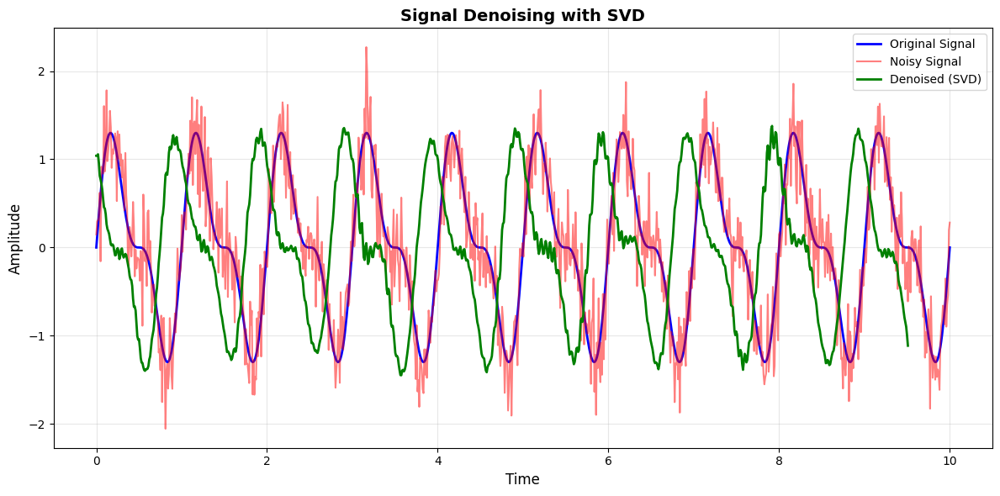

In [30]:
matrix_denoised = U_k @ np.diag(s_k) @ Vt_k

# Extract denoised signal
denoised_signal = matrix_denoised[:, window_size // 2]


plt.figure(figsize=(12, 6))
plt.plot(t[:len(signal)], signal, 'b-', label='Original Signal', linewidth=2)
plt.plot(t[:len(noisy_signal)], noisy_signal, 'r-', alpha=0.5, label='Noisy Signal')
plt.plot(t[:len(denoised_signal)], denoised_signal, 'g-', label='Denoised (SVD)', linewidth=2)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Amplitude', fontsize=12)
plt.title('Signal Denoising with SVD', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()